In [ ]:
# Download sample images
!wget --no-check-certificate https://drive.google.com/uc?id=1qYzzxJUwcVcrH5ukAezNO9yk0Mp-YZpa -O baboon.png
!wget --no-check-certificate https://drive.google.com/uc?id=19YIRaD6UuiKsB1HJ7Kx6ya2MJAOZGetC -O picker_phantom.tif
!wget --no-check-certificate https://drive.google.com/uc?id=1cxPc_PS5lfQAfN5fg2nSviEzKXY9nOX5 -O flower.tif
!wget --no-check-certificate https://drive.google.com/uc?id=11wOKcn4pAZ0deoUcBSFtvoF91vUOMF7T -O girl.png
!wget --no-check-certificate https://drive.google.com/uc?id=1xyKcxNO1bzws7n25EIw9oIL5x9YaD20j -O tropical_rain.tif
!wget --no-check-certificate https://drive.google.com/uc?id=1ikOI6tXUCANtJ62ttNuZK47PdC_TNk5Z -O balloons_noisy.png

--2024-11-13 16:48:23--  https://drive.google.com/uc?id=1qYzzxJUwcVcrH5ukAezNO9yk0Mp-YZpa
Resolving drive.google.com (drive.google.com)... 74.125.197.102, 74.125.197.101, 74.125.197.100, ...
Connecting to drive.google.com (drive.google.com)|74.125.197.102|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://drive.usercontent.google.com/download?id=1qYzzxJUwcVcrH5ukAezNO9yk0Mp-YZpa [following]
--2024-11-13 16:48:24--  https://drive.usercontent.google.com/download?id=1qYzzxJUwcVcrH5ukAezNO9yk0Mp-YZpa
Resolving drive.usercontent.google.com (drive.usercontent.google.com)... 74.125.142.132, 2607:f8b0:400e:c08::84
Connecting to drive.usercontent.google.com (drive.usercontent.google.com)|74.125.142.132|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 651142 (636K) [image/png]
Saving to: ‘baboon.png’

baboon.png          100%[===================>] 635.88K  --.-KB/s    in 0.02s   

2024-11-13 16:48:26 (34.4 MB/s) - ‘baboon.png’ save

In [ ]:
# importing necessary packages
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
%matplotlib inline
from matplotlib import pyplot as plt

# 1. Color Channel Separtion and Visualization

In [ ]:
image=cv2.imread('baboon.png')
# pring image properties
height, width, channels = image.shape
print(f"Image height={height} px, width={width}, channels={channels}, and data type: {image.dtype}")

cv2_imshow(image)

In [ ]:
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Function to plot histograms for each channel
def plot_histograms(image):
    colors = ('red', 'green', 'blue')
    channel_ids = (0, 1, 2)

    plt.figure(figsize=(15, 5))

    for i, color in zip(channel_ids, colors):
        histogram, bin_edges = np.histogram(
            image[:, :, i], bins=256, range=(0, 256)
        )

        plt.plot(bin_edges[0:-1], histogram, color=color, label=f'{color} channel')

    plt.title('Histogram for RGB Channels')
    plt.xlabel('Pixel Intensity')
    plt.ylabel('Frequency')
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot histograms
plot_histograms(image_rgb)


In [ ]:
# OpenCV loads images in BGR (Blue, Green, Red) order by default,
# while Matplotlib expects images in RGB (Red, Green, Blue) order for correct color display.
# Therefore, we need to convert the image from BGR to RGB.
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB for matplotlib

# Separate the color channels (R, G, B)
red_channel = image_rgb[:, :, 0]
green_channel = image_rgb[:, :, 1]
blue_channel = image_rgb[:, :, 2]

# Enhance the red channel by increasing its intensity by 50
red_enhanced = np.clip(red_channel + 50, 0, 255).astype(np.uint8)
image_red_enhanced = image_rgb.copy()
image_red_enhanced[:, :, 0] = red_enhanced  # Replace original red channel

# Plot the original and manipulated images
fig, axes = plt.subplots(1, 5, figsize=(20, 5))
axes[0].imshow(image_rgb)
axes[0].set_title("Original Image (RGB)")
axes[0].axis("off")

axes[1].imshow(red_channel, cmap='gray')
axes[1].set_title("Red Channel")
axes[1].axis("off")

axes[2].imshow(green_channel, cmap='gray')
axes[2].set_title("Green Channel")
axes[2].axis("off")

axes[3].imshow(blue_channel, cmap='gray')
axes[3].set_title("Blue Channel")
axes[3].axis("off")

axes[4].imshow(image_red_enhanced)
axes[4].set_title("Enhanced Red Channel")
axes[4].axis("off")

plt.tight_layout()
plt.show()


# 2. Converting RGB Image to Grayscale Image

In [ ]:
image=cv2.imread('baboon.png')

image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB for matplotlib


# Method 1: Simple Average (R+G+B)/3
gray_simple = image_rgb.mean(axis=2).astype('uint8')

# Method 2: Weighted Average (0.299*R + 0.587*G + 0.114*B)
# Common weights used in image processing to account for human vision sensitivity
gray_weighted = (0.299 * image_rgb[:, :, 0] +
                 0.587 * image_rgb[:, :, 1] +
                 0.114 * image_rgb[:, :, 2]).astype('uint8')

# Display the original and grayscale images
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(image_rgb)
axes[0].set_title("Original Image (RGB)")
axes[0].axis("off")

axes[1].imshow(gray_simple, cmap='gray')
axes[1].set_title("Grayscale (Simple Average)")
axes[1].axis("off")

axes[2].imshow(gray_weighted, cmap='gray')
axes[2].set_title("Grayscale (Weighted Average)")
axes[2].axis("off")

plt.tight_layout()
plt.show()

# 3. Converting RGB Image to Different Color Spaces

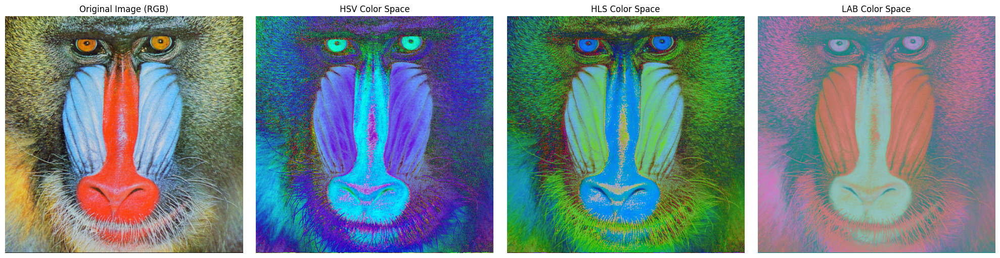

In [ ]:
image=cv2.imread('baboon.png')

image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB for matplotlib

# Convert the RGB image to different color spaces
image_hsv = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2HSV)  # Convert to HSV
image_hls = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2HLS)  # Convert to HLS
image_lab = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2LAB)  # Convert to LAB

# Plot the original and converted images
fig, axes = plt.subplots(1, 4, figsize=(20, 5))
axes[0].imshow(image_rgb)
axes[0].set_title("Original Image (RGB)")
axes[0].axis("off")

axes[1].imshow(image_hsv)
axes[1].set_title("HSV Color Space")
axes[1].axis("off")

axes[2].imshow(image_hls)
axes[2].set_title("HLS Color Space")
axes[2].axis("off")

axes[3].imshow(image_lab)
axes[3].set_title("LAB Color Space")
axes[3].axis("off")

plt.tight_layout()
plt.show()


# 4. Saturation and Hue Adjustment

In [ ]:
# Load an image in color
image = cv2.imread('baboon.png')
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert from BGR to RGB for display

# Convert to HSV color space
image_hsv = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2HSV).astype(np.float32)

# Increase saturation by 50%
increased_saturation = image_hsv.copy()
increased_saturation[:, :, 1] *= 1.5  # Increase saturation channel by 50%
increased_saturation[:, :, 1] = np.clip(increased_saturation[:, :, 1], 0, 255)  # Clip to valid range

# Decrease saturation by 50%
decreased_saturation = image_hsv.copy()
decreased_saturation[:, :, 1] *= 0.5  # Decrease saturation channel by 50%

# Convert back to RGB for visualization
increased_saturation_rgb = cv2.cvtColor(increased_saturation.astype(np.uint8), cv2.COLOR_HSV2RGB)
decreased_saturation_rgb = cv2.cvtColor(decreased_saturation.astype(np.uint8), cv2.COLOR_HSV2RGB)

# Plot the original and saturation-modified images
plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.imshow(image_rgb)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(increased_saturation_rgb)
plt.title('Increased Saturation (+50%)')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(decreased_saturation_rgb)
plt.title('Decreased Saturation (-50%)')
plt.axis('off')

plt.tight_layout()
plt.show()


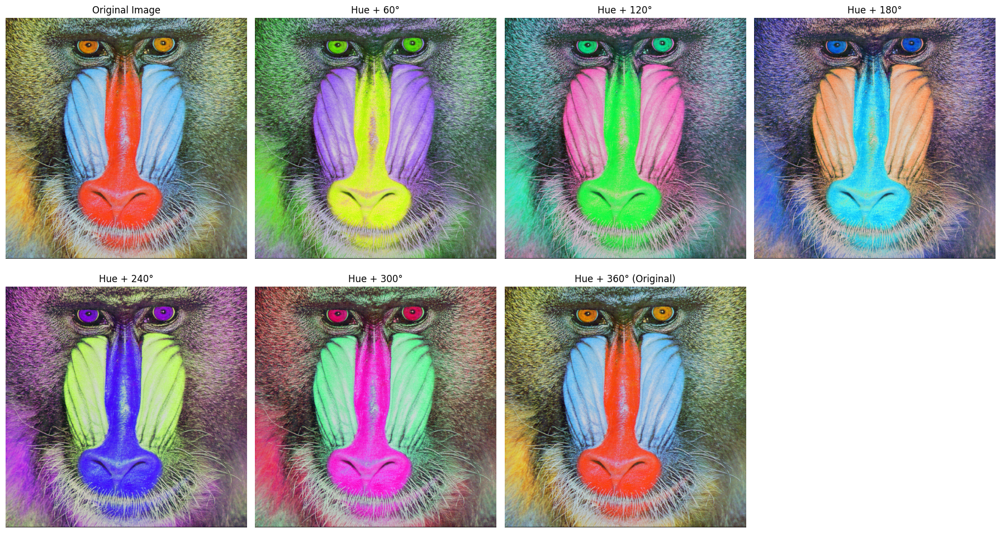

In [ ]:
# Function to modify hue
def adjust_hue(image_hsv, hue_shift):
    adjusted_hue = image_hsv.copy()
    adjusted_hue[:, :, 0] = (adjusted_hue[:, :, 0] + hue_shift) % 180  # Hue range is [0, 180] in OpenCV
    return cv2.cvtColor(adjusted_hue.astype(np.uint8), cv2.COLOR_HSV2RGB)

# List of hue shifts in degrees (converted to OpenCV's hue range)
hue_shifts = [60, 120, 180, 240, 300, 360]
titles = [f'Hue + {shift}°' for shift in hue_shifts[:-1]] + ["Hue + 360° (Original)"]

# Plot the original and hue-shifted images
plt.figure(figsize=(18, 10))

plt.subplot(2, 4, 1)
plt.imshow(image_rgb)
plt.title('Original Image')
plt.axis('off')

for i, shift in enumerate(hue_shifts):
    shifted_image_rgb = adjust_hue(image_hsv, shift // 2)  # Divide by 2 because OpenCV uses [0, 180] for hue
    plt.subplot(2, 4, i + 2)
    plt.imshow(shifted_image_rgb)
    plt.title(titles[i])
    plt.axis('off')

plt.tight_layout()
plt.show()


# 5. Color Masking

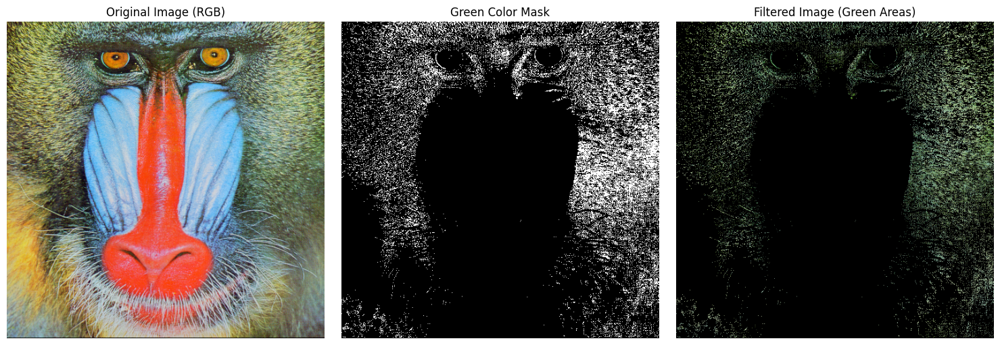

In [ ]:
# Load the color image
image = cv2.imread("baboon.png")  # Replace with your image path
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB for display with matplotlib

# Convert the image to HSV color space for easier color filtering
image_hsv = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2HSV)

# Define the HSV range for green color (adjust these values to isolate different shades of green)
lower_green = np.array([40, 40, 40])   # Lower bound of green in HSV
upper_green = np.array([80, 255, 255]) # Upper bound of green in HSV

# Create a mask for the green color
mask = cv2.inRange(image_hsv, lower_green, upper_green)

# Apply the mask to the original image to extract the green areas
filtered_image = cv2.bitwise_and(image_rgb, image_rgb, mask=mask)

# Display the results
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(image_rgb)
axes[0].set_title("Original Image (RGB)")
axes[0].axis("off")

axes[1].imshow(mask, cmap='gray')
axes[1].set_title("Green Color Mask")
axes[1].axis("off")

axes[2].imshow(filtered_image)
axes[2].set_title("Filtered Image (Green Areas)")
axes[2].axis("off")

plt.tight_layout()
plt.show()


# 6. Pseudocoloring

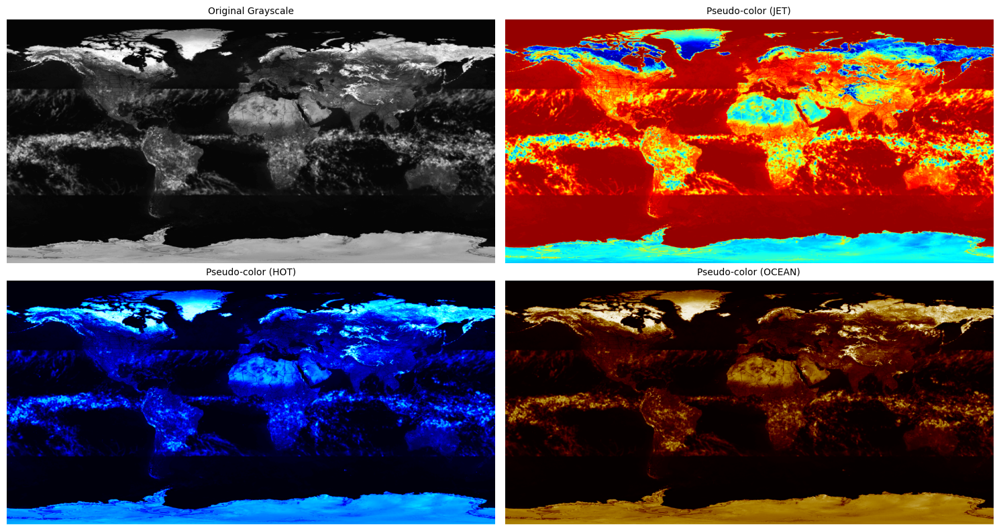

In [ ]:
# Load a grayscale image
# Replace with your grayscale image path (or use a color image and convert to grayscale)
gray_image = cv2.imread("tropical_rain.tif", cv2.IMREAD_GRAYSCALE)

# Apply different color maps for pseudo-coloring
# OpenCV provides several colormaps like COLORMAP_JET, COLORMAP_HOT, etc.
pseudo_color_jet = cv2.applyColorMap(gray_image, cv2.COLORMAP_JET)
pseudo_color_hot = cv2.applyColorMap(gray_image, cv2.COLORMAP_HOT)
pseudo_color_ocean = cv2.applyColorMap(gray_image, cv2.COLORMAP_OCEAN)

images = [gray_image, pseudo_color_jet, pseudo_color_hot, pseudo_color_ocean]
descriptions = ["Original Grayscale", "Pseudo-color (JET)", "Pseudo-color (HOT)", "Pseudo-color (OCEAN)"]


fig, axes = plt.subplots(2, 2, figsize=(15, 8))

for i, ax in enumerate(axes.flat):
    ax.imshow(images[i], cmap='gray')  # Display the image in grayscale
    ax.set_title(descriptions[i], fontsize=10)
    ax.axis('off')  # Hide axes

plt.tight_layout()
plt.show()


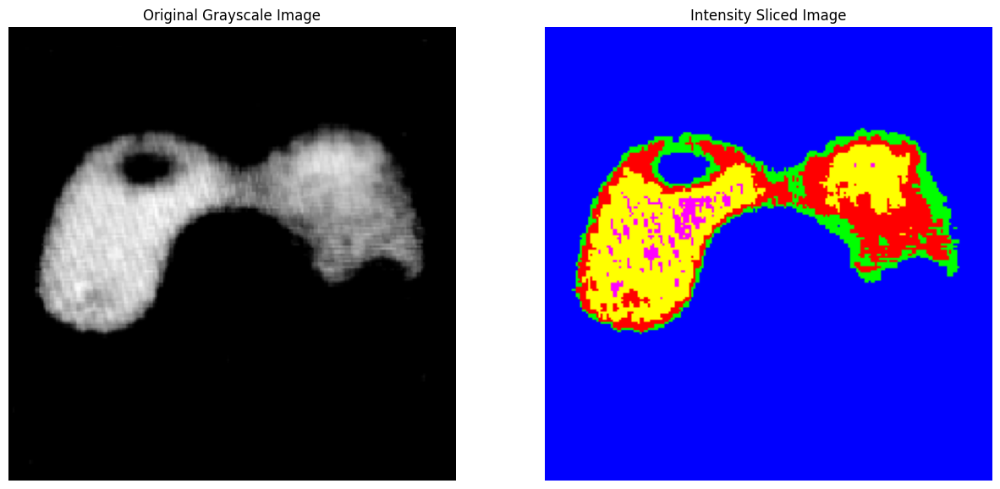

In [ ]:
# Function to apply intensity slicing using eight colors
def intensity_slicing(image):
    # Define the color map with eight distinct colors (as RGB tuples)
    colors = [
        (0, 0, 255),    # Red
        (0, 255, 0),    # Green
        (255, 0, 0),    # Blue
        (255, 255, 0),  # Yellow
        (255, 0, 255),  # Magenta
        (0, 255, 255),  # Cyan
        (128, 0, 128),  # Purple
        (255, 165, 0)   # Orange
    ]

    num_colors = len(colors)

    # Determine the intensity range for each color slice
    slice_size = 256 // num_colors

    # Create an empty color image for the output
    color_image = np.zeros((image.shape[0], image.shape[1], 3), dtype=np.uint8)

    # Apply intensity slicing
    for i in range(num_colors):
        # Define the range of intensities for this slice
        lower_bound = i * slice_size
        upper_bound = (i + 1) * slice_size if i < num_colors - 1 else 256

        # Create a mask for pixels within this intensity range
        mask = (image >= lower_bound) & (image < upper_bound)

        # Assign the corresponding color to the pixels within the mask
        color_image[mask] = colors[i]

    return color_image

# Load a grayscale image
image = cv2.imread('picker_phantom.tif', cv2.IMREAD_GRAYSCALE)

# Apply intensity slicing
sliced_image = intensity_slicing(image)

# Display the original and sliced images side by side
plt.figure(figsize=(15, 7))
plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Grayscale Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(sliced_image)
plt.title('Intensity Sliced Image')
plt.axis('off')

plt.show()

# 7. JPEG Image Compression

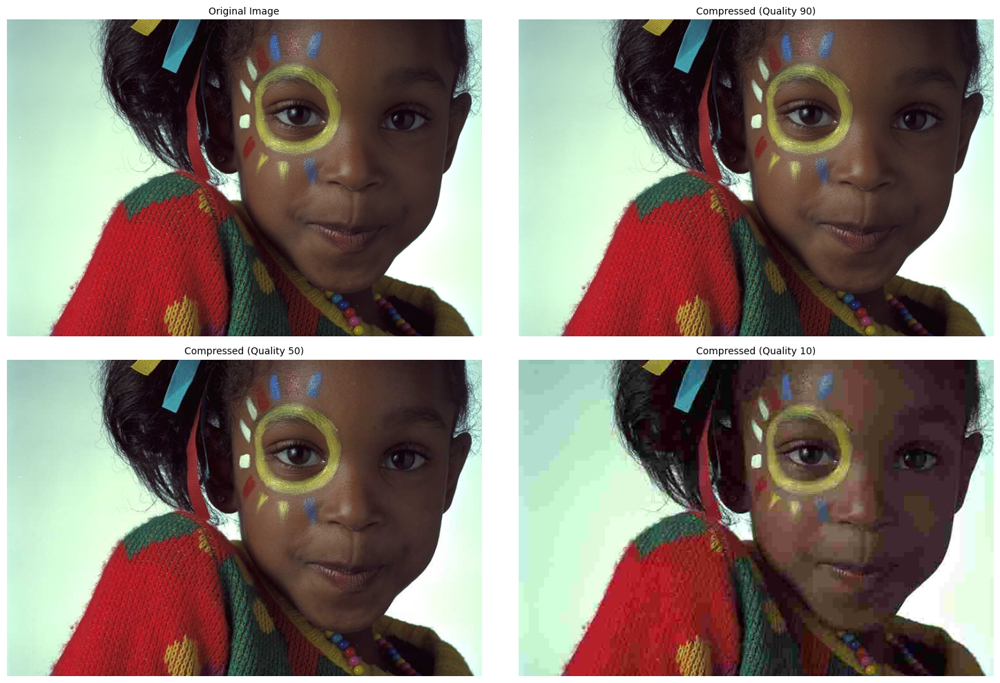

In [ ]:
import os
# Load the original image in RGB
image = cv2.imread("girl.png")  # Replace with your image path
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB for display with matplotlib

# Define JPEG quality levels for compression
quality_levels = [90, 50, 10]  # High, medium, and low quality levels
compressed_images = []
file_sizes = []

# Compress the image at different quality levels and save them to view the size
for quality in quality_levels:
    # Define the output file path
    output_path = f"compressed_quality_{quality}.jpg"

    # Compress and save the image using the specified quality level
    cv2.imwrite(output_path, image, [cv2.IMWRITE_JPEG_QUALITY, quality])

    # Load the compressed image for display
    compressed_image = cv2.imread(output_path)
    compressed_images.append(cv2.cvtColor(compressed_image, cv2.COLOR_BGR2RGB))  # Convert to RGB

    # Get the file size of the compressed image
    file_size = os.path.getsize(output_path) / 1024  # Size in KB
    file_sizes.append(file_size)


images = [image_rgb] + compressed_images
descriptions = ["Original Image"] + [f"Compressed (Quality {quality})" for (quality, size) in zip(quality_levels, file_sizes)]

fig, axes = plt.subplots(2, 2, figsize=(15, 10))

for i, ax in enumerate(axes.flat):
    ax.imshow(images[i], cmap='gray')  # Display the image in grayscale
    ax.set_title(descriptions[i], fontsize=10)
    ax.axis('off')  # Hide axes

plt.tight_layout()
plt.show()

# Clean up saved files
for quality in quality_levels:
    os.remove(f"compressed_quality_{quality}.jpg")
